In [1]:
import os
import math
#import graphviz

import sklearn.metrics as metrics
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn

from numpy import load
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import f1_score
from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

from xgboost import XGBClassifier

from sklearn.impute import KNNImputer

from sklearn.svm import SVC

%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

rd_seed = 333

## Načtení dat

In [2]:
path_file = os.sep.join(['created_data', 'matrix_bak.csv'])
matrix_bak = pd.read_csv(path_file, sep=",")

## Info o datasetu

In [3]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8043 entries, 0 to 8042
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   studium_id              8043 non-null   int64  
 1   pohlavi_kod             8043 non-null   int64  
 2   je_cech                 8043 non-null   int64  
 3   datum_zahajeni          8043 non-null   int64  
 4   rok_maturity            8043 non-null   int64  
 5   maturita_nastup_rozdil  8043 non-null   int64  
 6   gymnazium               8043 non-null   int64  
 7   praha                   8043 non-null   int64  
 8   scio                    8043 non-null   int64  
 9   olym                    8043 non-null   int64  
 10  zkouska                 8043 non-null   int64  
 11  prominuti               8043 non-null   int64  
 12  dostudoval_uspesne      8043 non-null   int64  
 13  BI-PA1                  7870 non-null   float64
 14  BI-PAI                  7771 non-null   

In [4]:
matrix_bak.mean()

studium_id                1.040487e+07
pohlavi_kod               1.123959e-01
je_cech                   8.044262e-01
datum_zahajeni            2.014520e+03
rok_maturity              2.013731e+03
maturita_nastup_rozdil    7.888847e-01
gymnazium                 5.159766e-01
praha                     9.561109e-02
scio                      5.856024e-02
olym                      5.197066e-02
zkouska                   1.765510e-02
prominuti                 1.380082e-02
dostudoval_uspesne        2.627129e-01
BI-PA1                    3.023698e+00
BI-PAI                    2.751448e+00
BI-CAO                    2.061652e+00
BI-PS1                    3.089703e+00
BI-MLO                    2.859733e+00
BI-ZMA                    3.122120e+00
BI-PA2                    2.933333e+00
BI-DBS                    2.441259e+00
BI-SAP                    2.359312e+00
BI-LIN                    3.184519e+00
BI-AG1                    2.839988e+00
BI-AAG                    2.673702e+00
BI-ZDM                   

## Příprava datasetu

### Nastavení indexu

In [5]:
matrix_bak = matrix_bak.set_index(['studium_id'])

### Přidání příznaků

In [6]:
matrix_bak['prumer'] = matrix_bak.loc[:, 'BI-PA1':'BI-EMP'].mean(axis=1)

In [7]:
matrix_bak.mean()

pohlavi_kod                  0.112396
je_cech                      0.804426
datum_zahajeni            2014.519955
rok_maturity              2013.731070
maturita_nastup_rozdil       0.788885
gymnazium                    0.515977
praha                        0.095611
scio                         0.058560
olym                         0.051971
zkouska                      0.017655
prominuti                    0.013801
dostudoval_uspesne           0.262713
BI-PA1                       3.023698
BI-PAI                       2.751448
BI-CAO                       2.061652
BI-PS1                       3.089703
BI-MLO                       2.859733
BI-ZMA                       3.122120
BI-PA2                       2.933333
BI-DBS                       2.441259
BI-SAP                       2.359312
BI-LIN                       3.184519
BI-AG1                       2.839988
BI-AAG                       2.673702
BI-ZDM                       2.786905
BI-OSY                       2.682884
BI-PSI      

### Doplnění NaN hodnot

##### Doplnění nulou

In [8]:
matrix_bak.prumer = matrix_bak.prumer.fillna(5)
matrix_bak = matrix_bak.fillna(int(0))

In [9]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8043 entries, 1578106 to 1577906
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   pohlavi_kod             8043 non-null   int64  
 1   je_cech                 8043 non-null   int64  
 2   datum_zahajeni          8043 non-null   int64  
 3   rok_maturity            8043 non-null   int64  
 4   maturita_nastup_rozdil  8043 non-null   int64  
 5   gymnazium               8043 non-null   int64  
 6   praha                   8043 non-null   int64  
 7   scio                    8043 non-null   int64  
 8   olym                    8043 non-null   int64  
 9   zkouska                 8043 non-null   int64  
 10  prominuti               8043 non-null   int64  
 11  dostudoval_uspesne      8043 non-null   int64  
 12  BI-PA1                  8043 non-null   float64
 13  BI-PAI                  8043 non-null   float64
 14  BI-CAO                  8043 no

In [10]:
matrix_bak

,pohlavi_kod,je_cech,datum_zahajeni,rok_maturity,maturita_nastup_rozdil,gymnazium,praha,scio,olym,zkouska,prominuti,dostudoval_uspesne,BI-PA1,BI-PAI,BI-CAO,BI-PS1,BI-MLO,BI-ZMA,BI-PA2,BI-DBS,BI-SAP,BI-LIN,BI-AG1,BI-AAG,BI-ZDM,BI-OSY,BI-PSI,BI-BEZ,BI-PST,BI-DPR,BI-SI1.2,BI-EMP,prumer
studium_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1578106,0,0,2009,2007,2,0,-1,0,0,0,0,1,2.0,1.5,1.5,2.0,2.0,2.0,3.0,2.0,1.5,1.0,0.0,2.0,3.0,1.5,2.0,3.0,1.5,1.5,2.5,3.0,2.026316
1584806,0,0,2009,2006,3,0,-1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.000000
19374606,0,1,2021,2009,12,1,0,0,1,0,0,0,4.0,0.0,4.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.000000
4783406,0,1,2011,2009,2,1,0,0,0,0,0,0,4.0,3.0,1.5,4.0,2.5,2.5,0.0,0.0,4.0,4.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,3.277778
8396706,1,1,2013,2009,4,0,0,0,0,0,0,0,4.0,4.0,4.0,4.0,4.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.000000
4047706,0,1,2010,2009,1,1,0,0,0,0,0,1,3.0,3.0,1.5,3.0,1.5,1.5,3.0,2.0,1.5,2.5,0.0,2.5,2.0,2.5,2.5,2.5,2.0,1.5,1.5,2.5,2.210526
4288906,0,1,2010,2010,0,1,0,1,0,0,0,0,4.0,4.0,1.5,2.5,1.5,1.0,4.0,0.0,4.0,4.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,3.050000
5497506,1,1,2011,2009,2,1,0,0,0,0,0,0,2.5,3.0,3.0,4.0,3.0,4.0,4.0,4.0,1.5,2.0,0.0,4.0,4.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,3.153846
9226106,0,1,2014,2009,5,1,0,0,0,0,0,0,1.5,1.5,1.0,2.5,2.0,1.5,4.0,2.5,4.0,2.0,0.0,3.0,3.0,2.5,2.5,4.0,4.0,1.0,2.0,4.0,2.552632


### Pomocné promenné

In [11]:
# predmety podle doporuceneho semestru
courses_1 = ['BI-PA1', 'BI-PAI', 'BI-CAO', 'BI-PS1', 'BI-MLO', 'BI-ZMA']
courses_2 = ['BI-PA2', 'BI-DBS', 'BI-SAP', 'BI-LIN']
courses_3 = ['BI-AAG', 'BI-ZDM', 'BI-AG1']
courses_4 = ['BI-OSY', 'BI-PSI', 'BI-BEZ']
courses_5 = ['BI-PST']
courses_6 = ['BI-DPR']
courses_7 = ['BI-SI1.2', 'BI-EMP']

courses = courses_1 + courses_2 + courses_3 + courses_4 + courses_5 + courses_6 + courses_7

In [12]:
means = {'BI-PA1':3, 'BI-PAI':3, 'BI-CAO':2, 'BI-PS1':3, 'BI-MLO':3, 'BI-ZMA':3,
        'BI-PA2':3, 'BI-DBS':2.5, 'BI-SAP':2.5, 'BI-LIN':3,
        'BI-AAG':3, 'BI-ZDM':3, 'BI-AG1':3,
        'BI-OSY':2.5, 'BI-PSI':2.5, 'BI-BEZ':2.5,
        'BI-PST':2,
        'BI-DPR':1.5,
        'BI-SI1.2':2, 'BI-EMP':2
        }

prumer_mean = 3

### Nastavení atributů na kategorické - ordinální

In [13]:
# ordinální
grades_category = pd.api.types.CategoricalDtype(categories=[1, 1.5, 2, 2.5, 3, 4, 0], ordered=True)
# BI-PA1
matrix_bak['BI-PA1'] = matrix_bak['BI-PA1'].astype(grades_category)
# BI-PAI
matrix_bak['BI-PAI'] = matrix_bak['BI-PAI'].astype(grades_category)
# BI-CAO
matrix_bak['BI-CAO'] = matrix_bak['BI-CAO'].astype(grades_category)
# BI-PS1
matrix_bak['BI-PS1'] = matrix_bak['BI-PS1'].astype(grades_category)
# BI-MLO
matrix_bak['BI-MLO'] = matrix_bak['BI-MLO'].astype(grades_category)
# BI-ZMA
matrix_bak['BI-ZMA'] = matrix_bak['BI-ZMA'].astype(grades_category)
# BI-PA2
matrix_bak['BI-PA2'] = matrix_bak['BI-PA2'].astype(grades_category)
# BI-DBS
matrix_bak['BI-DBS'] = matrix_bak['BI-DBS'].astype(grades_category)
# BI-SAP
matrix_bak['BI-SAP'] = matrix_bak['BI-SAP'].astype(grades_category)
# BI-LIN
matrix_bak['BI-LIN'] = matrix_bak['BI-LIN'].astype(grades_category)
# BI-AG1
matrix_bak['BI-AG1'] = matrix_bak['BI-AG1'].astype(grades_category)
# BI-AAG
matrix_bak['BI-AAG'] = matrix_bak['BI-AAG'].astype(grades_category)
# BI-ZDM
matrix_bak['BI-ZDM'] = matrix_bak['BI-ZDM'].astype(grades_category)
# BI-OSY
matrix_bak['BI-OSY'] = matrix_bak['BI-OSY'].astype(grades_category)
# BI-PSI
matrix_bak['BI-PSI'] = matrix_bak['BI-PSI'].astype(grades_category)
# BI-BEZ
matrix_bak['BI-BEZ'] = matrix_bak['BI-BEZ'].astype(grades_category)
# BI-PST
matrix_bak['BI-PST'] = matrix_bak['BI-PST'].astype(grades_category)
# BI-SI1.2
matrix_bak['BI-SI1.2'] = matrix_bak['BI-SI1.2'].astype(grades_category)
# BI-MLO
matrix_bak['BI-EMP'] = matrix_bak['BI-EMP'].astype(grades_category)
# BI-DPR
matrix_bak['BI-DPR'] = matrix_bak['BI-DPR'].astype(grades_category)

### Nastavení nepředmětových atributů na kategorické

In [14]:
# ordinální
attr_category = pd.api.types.CategoricalDtype(categories=[0, 1], ordered=False)
# pohlavi_kod
matrix_bak['pohlavi_kod'] = matrix_bak['pohlavi_kod'].astype(attr_category)
# scio
matrix_bak['scio'] = matrix_bak['scio'].astype(attr_category)
# olym
matrix_bak['olym'] = matrix_bak['olym'].astype(attr_category)
# zkouska
matrix_bak['zkouska'] = matrix_bak['zkouska'].astype(attr_category)
# prominuti
matrix_bak['prominuti'] = matrix_bak['prominuti'].astype(attr_category)

In [15]:
# ordinální
attr_category = pd.api.types.CategoricalDtype(categories=[-1, 0, 1], ordered=False)
# je_cech
matrix_bak['je_cech'] = matrix_bak['je_cech'].astype(attr_category)
# gymnazium
matrix_bak['gymnazium'] = matrix_bak['gymnazium'].astype(attr_category)
# praha
matrix_bak['praha'] = matrix_bak['praha'].astype(attr_category)

In [16]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8043 entries, 1578106 to 1577906
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   pohlavi_kod             8043 non-null   category
 1   je_cech                 8043 non-null   category
 2   datum_zahajeni          8043 non-null   int64   
 3   rok_maturity            8043 non-null   int64   
 4   maturita_nastup_rozdil  8043 non-null   int64   
 5   gymnazium               8043 non-null   category
 6   praha                   8043 non-null   category
 7   scio                    8043 non-null   category
 8   olym                    8043 non-null   category
 9   zkouska                 8043 non-null   category
 10  prominuti               8043 non-null   category
 11  dostudoval_uspesne      8043 non-null   int64   
 12  BI-PA1                  8043 non-null   category
 13  BI-PAI                  8043 non-null   category
 14  BI-CAO         

## Modelování

### Bakalář všechny pp

#### Rozdělení datasetu

In [17]:
Xdata = matrix_bak.drop(columns='dostudoval_uspesne')
ydata = matrix_bak.dostudoval_uspesne

In [18]:
Xtrain, Xtest, ytrain, ytest = train_test_split(Xdata, ydata, test_size=0.2, random_state=rd_seed, stratify=ydata, shuffle=True) 
print("původní data")
display(Xdata.shape)
display(ydata.shape)
print("trénovací data")
display(Xtrain.shape)
display(ytrain.shape)
print("testovací data")
display(Xtest.shape)
display(ytest.shape)

původní data


(8043, 32)

(8043,)

trénovací data


(6434, 32)

(6434,)

testovací data


(1609, 32)

(1609,)

#### Funkce pro vybrání vhodných hyperparametrů pomocí křížové validace

In [19]:
def get_best_parameters(param_grid, classifier, xgb=None):
    score = 'f1'
    if xgb:
        model = GridSearchCV(classifier(eval_metric='mlogloss', use_label_encoder=False, tree_method="gpu_hist", enable_categorical=True), param_grid, cv=5, scoring=score)
    else:
        model = GridSearchCV(classifier(), param_grid, cv=5, scoring=score)
    model.fit(Xtrain, ytrain)

    print('Best hyper-parameters are: ')
    print(model.best_params_)
    print()

    means = model.cv_results_["mean_test_score"]
    stds = model.cv_results_["std_test_score"]
    for mean, std, params in zip(means, stds, model.cv_results_["params"]):
        print("%0.6f (+/-%0.06f) for %r" % (mean, std * 2, params))
    print()
    return model

#### Rozhodovací strom

In [20]:
param_grid = [
    {'criterion':['gini','entropy'],
    'max_depth': range(2,7),
    'min_samples_leaf':[10]}
]

In [21]:
dt_f1 = get_best_parameters(param_grid, DecisionTreeClassifier)

Best hyper-parameters are: 
{'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 10}

0.955237 (+/-0.005707) for {'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 10}
0.962275 (+/-0.003418) for {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 10}
0.966414 (+/-0.003672) for {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 10}
0.966414 (+/-0.003672) for {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 10}
0.966414 (+/-0.003672) for {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 10}
0.956174 (+/-0.008927) for {'criterion': 'entropy', 'max_depth': 2, 'min_samples_leaf': 10}
0.963206 (+/-0.006888) for {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10}
0.963206 (+/-0.006888) for {'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 10}
0.964558 (+/-0.006218) for {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 10}
0.962604 (+/-0.008504) for {'criterion': 'entropy', 'max_depth': 6, 'min_samples_leaf': 10}



In [22]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, dt_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, dt_f1.predict(Xtest))))

accuracy score (train): 0.982437
accuracy score (test): 0.978869


In [23]:
feature_importances=pd.DataFrame({'features':Xtrain.columns,'feature_importance':dt_f1.best_estimator_.feature_importances_})
feature_importances.sort_values('feature_importance',ascending=False)

,features,feature_importance
28,BI-DPR,0.968392
22,BI-AAG,0.020164
20,BI-LIN,0.011443
0,pohlavi_kod,0.000000
1,je_cech,0.000000
30,BI-EMP,0.000000
29,BI-SI1.2,0.000000
27,BI-PST,0.000000
26,BI-BEZ,0.000000
25,BI-PSI,0.000000


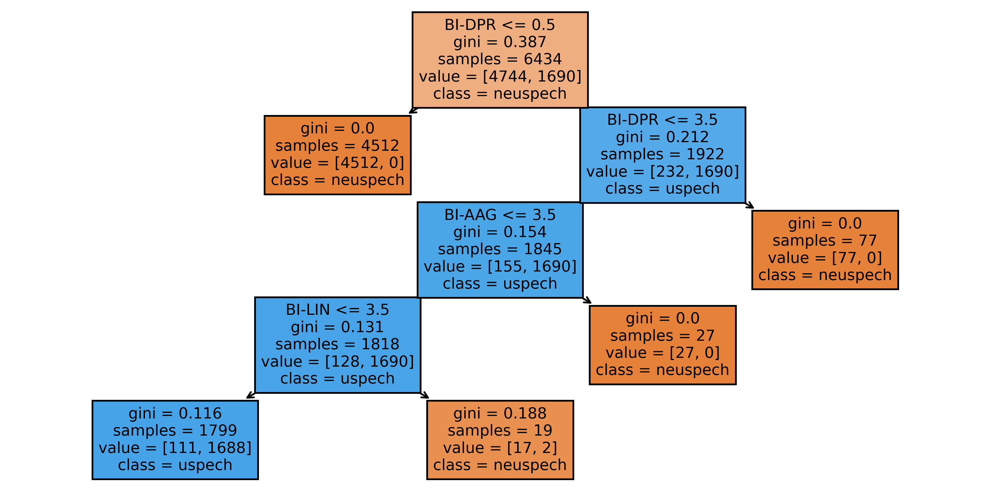

In [24]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,5), dpi=500)
tree.plot_tree(dt_f1.best_estimator_,
               feature_names = Xdata.columns, 
               class_names=['neuspech', 'uspech'],
               filled = True);
fig.savefig('tree_f1.png')

#### Random forest

In [25]:
param_grid_rf = {
    'criterion':['gini','entropy'],
    'n_estimators': range(5, 50, 5),
    'max_depth': range(2, 4),
    'max_features': ['sqrt', 'log2', None],
    'min_samples_leaf':[10]
}

In [26]:
rf_f1 = get_best_parameters(param_grid_rf, RandomForestClassifier)

Best hyper-parameters are: 
{'criterion': 'gini', 'max_depth': 3, 'max_features': None, 'min_samples_leaf': 10, 'n_estimators': 15}

0.937449 (+/-0.005750) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 5}
0.941276 (+/-0.011323) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 10}
0.945199 (+/-0.005879) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 15}
0.943917 (+/-0.013260) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 20}
0.945763 (+/-0.012866) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 25}
0.946007 (+/-0.009290) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 30}
0.947317 (+/-0.005478) for {'criterion': 'gini', 'max_depth': 2, 'max_

In [27]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, rf_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, rf_f1.predict(Xtest))))

accuracy score (train): 0.980572
accuracy score (test): 0.978247


In [28]:
feature_importances=pd.DataFrame({'features':Xtrain.columns,'feature_importance':rf_f1.best_estimator_.feature_importances_})
feature_importances.sort_values('feature_importance',ascending=False)

,features,feature_importance
28,BI-DPR,0.979518
22,BI-AAG,0.012198
20,BI-LIN,0.006976
31,prumer,0.001265
17,BI-PA2,0.000043
1,je_cech,0.000000
30,BI-EMP,0.000000
29,BI-SI1.2,0.000000
27,BI-PST,0.000000
26,BI-BEZ,0.000000


#### SVM

In [29]:
param_grid_svm = {
    'kernel':['linear', 'rbf'],
    'gamma':['auto', 'scale'],
    'C':[100, 10, 1, 0.1]
}
param_comb_svm = ParameterGrid(param_grid_svm)

In [30]:
svc_f1 = get_best_parameters(param_grid_svm, SVC)

Best hyper-parameters are: 
{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}

0.931393 (+/-0.012681) for {'C': 100, 'gamma': 'auto', 'kernel': 'linear'}
0.942207 (+/-0.007482) for {'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}
0.931393 (+/-0.012681) for {'C': 100, 'gamma': 'scale', 'kernel': 'linear'}
0.000000 (+/-0.000000) for {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}
0.931240 (+/-0.015438) for {'C': 10, 'gamma': 'auto', 'kernel': 'linear'}
0.959966 (+/-0.006612) for {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
0.931240 (+/-0.015438) for {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
0.000000 (+/-0.000000) for {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
0.931297 (+/-0.017624) for {'C': 1, 'gamma': 'auto', 'kernel': 'linear'}
0.958888 (+/-0.011364) for {'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}
0.931297 (+/-0.017624) for {'C': 1, 'gamma': 'scale', 'kernel': 'linear'}
0.000000 (+/-0.000000) for {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}
0.936100 (+/-0.010130) for {'C': 0.1, 'gamma': 'aut

In [31]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, svc_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, svc_f1.predict(Xtest))))

accuracy score (train): 0.991918
accuracy score (test): 0.977626


#### Adaboost

In [32]:
param_grid_ab = {
    'n_estimators': range(5, 50, 5),
    'learning_rate': np.arange(0.1, 1., 0.1)
}

In [33]:
ab_f1 = get_best_parameters(param_grid_ab, AdaBoostClassifier)

Best hyper-parameters are: 
{'learning_rate': 0.4, 'n_estimators': 40}

0.952743 (+/-0.007667) for {'learning_rate': 0.1, 'n_estimators': 5}
0.954666 (+/-0.008974) for {'learning_rate': 0.1, 'n_estimators': 10}
0.961695 (+/-0.005774) for {'learning_rate': 0.1, 'n_estimators': 15}
0.961969 (+/-0.005858) for {'learning_rate': 0.1, 'n_estimators': 20}
0.962244 (+/-0.006141) for {'learning_rate': 0.1, 'n_estimators': 25}
0.963343 (+/-0.005658) for {'learning_rate': 0.1, 'n_estimators': 30}
0.965555 (+/-0.005495) for {'learning_rate': 0.1, 'n_estimators': 35}
0.968354 (+/-0.004077) for {'learning_rate': 0.1, 'n_estimators': 40}
0.968914 (+/-0.005295) for {'learning_rate': 0.1, 'n_estimators': 45}
0.953039 (+/-0.008811) for {'learning_rate': 0.2, 'n_estimators': 5}
0.958707 (+/-0.006058) for {'learning_rate': 0.2, 'n_estimators': 10}
0.962522 (+/-0.004428) for {'learning_rate': 0.2, 'n_estimators': 15}
0.965300 (+/-0.003325) for {'learning_rate': 0.2, 'n_estimators': 20}
0.966944 (+/-0.00481

In [34]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, ab_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, ab_f1.predict(Xtest))))

accuracy score (train): 0.985546
accuracy score (test): 0.983219


In [35]:
feature_importances=pd.DataFrame({'features':Xtrain.columns,'feature_importance':ab_f1.best_estimator_.feature_importances_})
feature_importances.sort_values('feature_importance',ascending=False)

,features,feature_importance
28,BI-DPR,0.175
31,prumer,0.100
3,rok_maturity,0.075
27,BI-PST,0.075
24,BI-OSY,0.075
22,BI-AAG,0.075
20,BI-LIN,0.075
17,BI-PA2,0.050
4,maturita_nastup_rozdil,0.050
26,BI-BEZ,0.050


#### Xgboost

In [36]:
param_grid = {
    'eta': np.arange(0.1, 1., 0.1),
    'max_depth': range(3, 8)
}
param_comb = ParameterGrid(param_grid)

In [37]:
xgb_f1 = get_best_parameters(param_grid, XGBClassifier, True)

Best hyper-parameters are: 
{'eta': 0.1, 'max_depth': 3}

0.969523 (+/-0.004225) for {'eta': 0.1, 'max_depth': 3}
0.969474 (+/-0.004120) for {'eta': 0.1, 'max_depth': 4}
0.967988 (+/-0.004486) for {'eta': 0.1, 'max_depth': 5}
0.967149 (+/-0.005220) for {'eta': 0.1, 'max_depth': 6}
0.967991 (+/-0.005724) for {'eta': 0.1, 'max_depth': 7}
0.967986 (+/-0.003272) for {'eta': 0.2, 'max_depth': 3}
0.965617 (+/-0.008261) for {'eta': 0.2, 'max_depth': 4}
0.966538 (+/-0.005742) for {'eta': 0.2, 'max_depth': 5}
0.966496 (+/-0.004906) for {'eta': 0.2, 'max_depth': 6}
0.967124 (+/-0.005678) for {'eta': 0.2, 'max_depth': 7}
0.966789 (+/-0.004168) for {'eta': 0.30000000000000004, 'max_depth': 3}
0.966493 (+/-0.006177) for {'eta': 0.30000000000000004, 'max_depth': 4}
0.967358 (+/-0.006582) for {'eta': 0.30000000000000004, 'max_depth': 5}
0.965938 (+/-0.009196) for {'eta': 0.30000000000000004, 'max_depth': 6}
0.964741 (+/-0.006944) for {'eta': 0.30000000000000004, 'max_depth': 7}
0.963189 (+/-0.010304)

In [38]:
print('accuracy score XGBoost (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, xgb_f1.predict(Xtrain))))
print('accuracy score XGBoost (val): {0:.6f}'.format(metrics.accuracy_score(ytest, xgb_f1.predict(Xtest))))

accuracy score XGBoost (train): 0.986323
accuracy score XGBoost (val): 0.981976


In [39]:
feat_imp = pd.Series(xgb_f1.best_estimator_.get_booster().get_fscore()).sort_values(ascending=False)

In [40]:
feat_imp

BI-DPR                    95.0
BI-OSY                    49.0
BI-LIN                    37.0
prumer                    34.0
BI-EMP                    21.0
BI-PA2                    20.0
maturita_nastup_rozdil    17.0
BI-PST                    16.0
rok_maturity              15.0
BI-BEZ                    12.0
BI-AAG                    12.0
BI-DBS                    12.0
BI-PA1                     8.0
BI-MLO                     7.0
datum_zahajeni             7.0
BI-PS1                     6.0
BI-AG1                     5.0
BI-ZDM                     4.0
BI-SAP                     4.0
BI-ZMA                     3.0
BI-PSI                     3.0
BI-CAO                     2.0
BI-PAI                     2.0
dtype: float64

#### MLP

In [41]:
mlp = MLPClassifier(random_state=1, max_iter=500).fit(Xtrain, ytrain)

In [42]:
print('accuracy score mlp (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, mlp.predict(Xtrain))))
print('accuracy score mlp (val): {0:.6f}'.format(metrics.accuracy_score(ytest, mlp.predict(Xtest))))

accuracy score mlp (train): 0.944514
accuracy score mlp (val): 0.942822


#### Lineární regrese

In [43]:
reg = LinearRegression().fit(Xtrain, ytrain)

In [44]:
print('RMSE reg (test):', np.sqrt(mean_squared_error(reg.predict(Xtrain), np.array(ytrain))))
print('RMSE reg (test):', np.sqrt(mean_squared_error(reg.predict(Xtest), np.array(ytest))))

RMSE reg (test): 0.23238419770080931
RMSE reg (test): 0.2361825423678247


#### kNN

In [45]:
param_grid = {
    'n_neighbors' : range(1, 12), # Počet nejbližších sousedů
    'p': range(1, 3), # Stupeň Minkowského vzdálenosti
    'weights': ['uniform', 'distance'], # Aritmetický, nebo vážený průměr
}
param_comb = ParameterGrid(param_grid)

In [46]:
knn = get_best_parameters(param_grid, KNeighborsClassifier)

Best hyper-parameters are: 
{'n_neighbors': 8, 'p': 1, 'weights': 'uniform'}

0.931442 (+/-0.005477) for {'n_neighbors': 1, 'p': 1, 'weights': 'uniform'}
0.931442 (+/-0.005477) for {'n_neighbors': 1, 'p': 1, 'weights': 'distance'}
0.918705 (+/-0.008634) for {'n_neighbors': 1, 'p': 2, 'weights': 'uniform'}
0.918705 (+/-0.008634) for {'n_neighbors': 1, 'p': 2, 'weights': 'distance'}
0.916554 (+/-0.013042) for {'n_neighbors': 2, 'p': 1, 'weights': 'uniform'}
0.929844 (+/-0.008377) for {'n_neighbors': 2, 'p': 1, 'weights': 'distance'}
0.915103 (+/-0.016643) for {'n_neighbors': 2, 'p': 2, 'weights': 'uniform'}
0.918096 (+/-0.008301) for {'n_neighbors': 2, 'p': 2, 'weights': 'distance'}
0.933981 (+/-0.011927) for {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
0.934277 (+/-0.012304) for {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
0.922134 (+/-0.012506) for {'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
0.922388 (+/-0.012741) for {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
0.93

In [47]:
print('accuracy score knn (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, knn.predict(Xtrain))))
print('accuracy score knn (val): {0:.6f}'.format(metrics.accuracy_score(ytest, knn.predict(Xtest))))

accuracy score knn (train): 0.967672
accuracy score knn (val): 0.958981


## Testování po semestrech

### Doplnění 0

#### Pouze nepředmětové příznaky

In [48]:
Xtest_0 = Xtest.copy(deep=True)

courses_not_use = courses
for course in courses_not_use:
    Xtest_0.loc[:, course] = 0
Xtest_0.loc[:, 'prumer'] = 0

#### 1. semestr

In [49]:
Xtest_1 = Xtest.copy(deep=True)

courses_not_use = courses_2 + courses_3 + courses_4 + courses_5 + courses_6 + courses_7
for course in courses_not_use:
    Xtest_1.loc[:, course] = 0

courses_to_use = courses_1
Xtest_1.loc[:, 'prumer'] = Xtest_1.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První dva semestry

In [50]:
Xtest_2 = Xtest.copy(deep=True)

courses_not_use = courses_3 + courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_2.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2
Xtest_2.loc[:, 'prumer'] = Xtest_2.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První tři semestry

In [51]:
Xtest_3 = Xtest.copy(deep=True)

courses_not_use = courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_3.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2 + courses_3
Xtest_3.loc[:, 'prumer'] = Xtest_3.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První čtyři semestry 

In [52]:
Xtest_4 = Xtest.copy(deep=True)

courses_not_use = courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_4.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4
Xtest_4.loc[:, 'prumer'] = Xtest_4.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### Prvních pět semestrů

In [53]:
Xtest_5 = Xtest.copy(deep=True)

courses_not_use = courses_6 + courses_7

for course in courses_not_use:
    Xtest_5.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4 + courses_5
Xtest_5.loc[:, 'prumer'] = Xtest_5.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### Všechny semestry bez SI1.2 a EMP

In [54]:
Xtest_6 = Xtest.copy(deep=True)

courses_not_use = courses_7

for course in courses_not_use:
    Xtest_6.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4 + courses_5 + courses_6
Xtest_6.loc[:, 'prumer'] = Xtest_6.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

### Doplnění průměrem

#### Pouze nepředmětové příznaky

In [55]:
Xtest_0_mean = Xtest.copy(deep=True)

courses_not_use = courses
for course in courses_not_use:
    Xtest_0_mean.loc[:, course] = means[course]
    
Xtest_0_mean.loc[:, 'prumer'] = Xtest_0.loc[:, courses[0]:courses[-1]].mean(axis=1)

#### První semestr

In [56]:
Xtest_1_mean = Xtest.copy(deep=True)

courses_not_use = courses_2 + courses_3 + courses_4 + courses_5 + courses_6 + courses_7
for course in courses_not_use:
    Xtest_1_mean.loc[:, course] = means[course]

courses_to_use = courses_1
Xtest_1_mean['prumer'] = Xtest_1_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První dva semestry

In [57]:
Xtest_2_mean = Xtest.copy(deep=True)

courses_not_use = courses_3 + courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_2_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2
Xtest_2_mean['prumer'] = Xtest_2_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První tři semestry

In [58]:
Xtest_3_mean = Xtest.copy(deep=True)

courses_not_use = courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_3_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2 + courses_3
Xtest_3_mean['prumer'] = Xtest_3_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První čtyři semestry 

In [59]:
Xtest_4_mean = Xtest.copy(deep=True)

courses_not_use = courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_4_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4
Xtest_4_mean['prumer'] = Xtest_4_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### Prvních pět semestrů

In [60]:
Xtest_5_mean = Xtest.copy(deep=True)

courses_not_use = courses_6 + courses_7

for course in courses_not_use:
    Xtest_5_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4 + courses_5
Xtest_5_mean['prumer'] = Xtest_5_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### Všechny semestry bez SI1.2 a EMP

In [61]:
Xtest_6_mean = Xtest.copy(deep=True)

courses_not_use = courses_7

for course in courses_not_use:
    Xtest_6_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4 + courses_5 + courses_6
Xtest_6_mean['prumer'] = Xtest_6_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

## Výsledky

In [62]:
results = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])
results_mean = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])

results_f1 = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])
results_mean_f1 = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])

In [63]:
results_reg = pd.DataFrame(columns=['reg'], index=[0, 1, 2, 3, 4, 5, 6, 7])
results_reg_mean = pd.DataFrame(columns=['reg'], index=[0, 1, 2, 3, 4, 5, 6, 7])

### Linearní regrese měřena pomocí RMSE

#### Doplněno 0

In [64]:
x_test = {0:Xtest_0, 1:Xtest_1, 2:Xtest_2, 3:Xtest_3, 4:Xtest_4, 5:Xtest_5, 6:Xtest_6, 7:Xtest}
for i in range(0, 8):   
    results_reg.loc[i, 'reg'] = round(np.sqrt(mean_squared_error(reg.predict(x_test[i]), np.array(ytest))), 3)

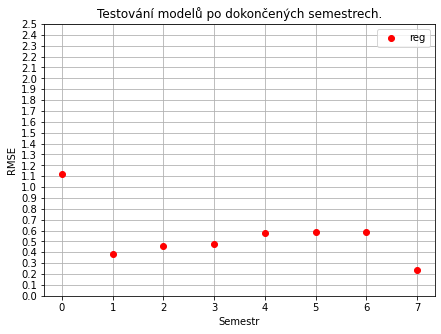

In [65]:
plt.figure(figsize=(7,5))
plt.grid(True)

xreg = results_reg['reg'].index
yreg = results_reg['reg'].values

y_values = np.arange(0.0, 2.55, 0.1)

plt.plot(xreg, yreg, 'o', color='r', label='reg')

plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('RMSE')

plt.legend()

plt.show()

In [66]:
results_reg

,reg
0,1.117
1,0.382
2,0.454
3,0.481
4,0.579
5,0.583
6,0.583
7,0.236


#### Doplněno průměrem

In [67]:
x_test_mean = {0:Xtest_0_mean, 1:Xtest_1_mean, 2:Xtest_2_mean, 3:Xtest_3_mean, 4:Xtest_4_mean, 5:Xtest_5_mean, 6:Xtest_6_mean, 7:Xtest}
for i in range(0, 8):
    results_reg_mean.loc[i, 'reg'] = round(np.sqrt(mean_squared_error(reg.predict(x_test_mean[i]), np.array(ytest))), 3)

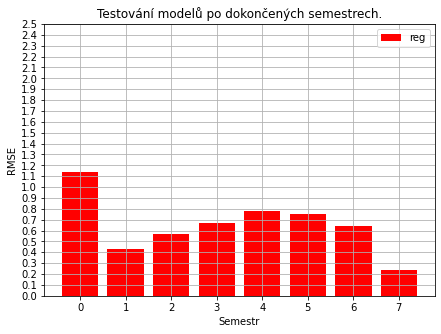

In [68]:
plt.figure(figsize=(7,5))
plt.grid(True)

xreg = results_reg_mean['reg'].index
yreg = results_reg_mean['reg'].values

y_values = np.arange(0.0, 2.55, 0.1)

plt.bar(xreg, yreg, color='r', label='reg')

plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('RMSE')

plt.legend()

plt.show()

In [69]:
results_reg_mean

,reg
0,1.143
1,0.435
2,0.573
3,0.673
4,0.782
5,0.748
6,0.639
7,0.236


## Ostatní modely
### Měřeno accuracy_score

In [70]:
x_test = {0:Xtest_0, 1:Xtest_1, 2:Xtest_2, 3:Xtest_3, 4:Xtest_4, 5:Xtest_5, 6:Xtest_6, 7:Xtest}
for i in range(0, 8):
    results.loc[i, 'dt'] = round(metrics.accuracy_score(ytest, dt_f1.predict(x_test[i])), 3)
    results.loc[i, 'rf'] = round(metrics.accuracy_score(ytest, rf_f1.predict(x_test[i])), 3)
    results.loc[i, 'svm'] = round(metrics.accuracy_score(ytest, svc_f1.predict(x_test[i])), 3)
    results.loc[i, 'ab'] = round(metrics.accuracy_score(ytest, ab_f1.predict(x_test[i])), 3)
    results.loc[i, 'xgb'] = round(metrics.accuracy_score(ytest, xgb_f1.predict(x_test[i])), 3)
    results.loc[i, 'mlp'] = round(metrics.accuracy_score(ytest, mlp.predict(x_test[i])), 3)
    results.loc[i, 'knn'] = round(metrics.accuracy_score(ytest, knn.predict(x_test[i])), 3)

In [71]:
x_test_mean = {0:Xtest_0_mean, 1:Xtest_1_mean, 2:Xtest_2_mean, 3:Xtest_3_mean, 4:Xtest_4_mean, 5:Xtest_5_mean, 6:Xtest_6_mean, 7:Xtest}
for i in range(0, 8):
    results_mean.loc[i, 'dt'] = round(metrics.accuracy_score(ytest, dt_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'rf'] = round(metrics.accuracy_score(ytest, rf_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'svm'] = round(metrics.accuracy_score(ytest, svc_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'ab'] = round(metrics.accuracy_score(ytest, ab_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'xgb'] = round(metrics.accuracy_score(ytest, xgb_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'mlp'] = round(metrics.accuracy_score(ytest, mlp.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'knn'] = round(metrics.accuracy_score(ytest, knn.predict(x_test_mean[i])), 3)

#### Po doplnění 0

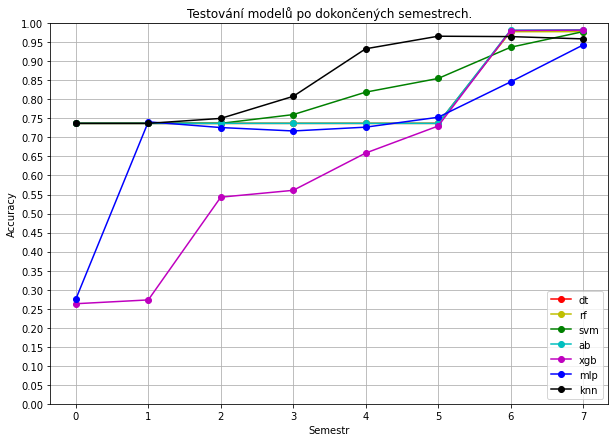

In [72]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results['dt'].index
ydt = results['dt'].values

xrf = results['rf'].index
yrf = results['rf'].values

xsvm = results['svm'].index
ysvm = results['svm'].values

xab = results['ab'].index
yab = results['ab'].values

xxgb = results['xgb'].index
yxgb = results['xgb'].values

xmlp = results['mlp'].index
ymlp = results['mlp'].values

xknn = results['knn'].index
yknn = results['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')


plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('Accuracy')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

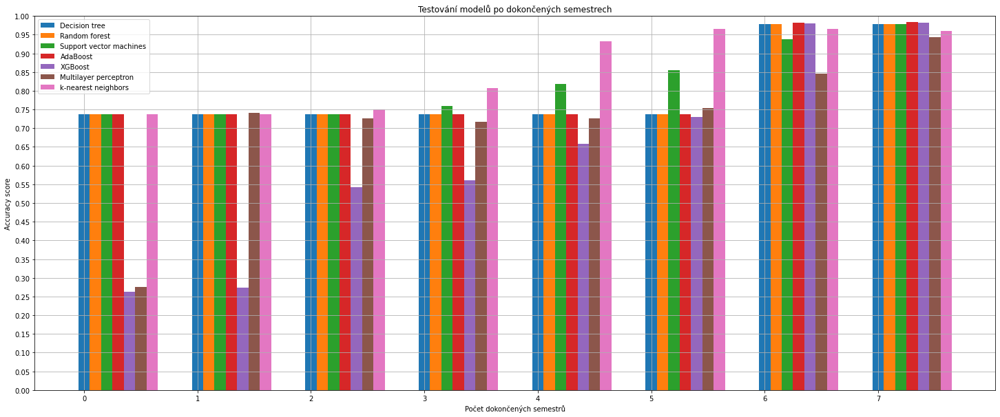

In [73]:
labels = np.array(results.index)

ydt = results['dt'].values

yrf = results['rf'].values

ysvm = results['svm'].values

yab = results['ab'].values

yxgb = results['xgb'].values

ymlp = results['mlp'].values

yknn = results['knn'].values

x = np.arange(len(labels))*2  # the label locations
width = 0.2  # the width of the bars


fig, ax = plt.subplots()
rects_dt = ax.bar(x , ydt, width, label='Decision tree')
rects_rf = ax.bar(x + width, yrf, width, label='Random forest')
rects_svm = ax.bar(x + width * 2, ysvm, width, label='Support vector machines')
rects_ab = ax.bar(x + width * 3, yab, width, label='AdaBoost')
rects_xgb = ax.bar(x + width * 4, yxgb, width, label='XGBoost')
rects_mlp = ax.bar(x + width * 5, ymlp, width, label='Multilayer perceptron')
rects_knn = ax.bar(x + width * 6, yknn, width, label='k-nearest neighbors')

y_values = np.arange(0.0, 1.05, 0.05)

ax.set_ylabel('Accuracy score')
ax.set_xlabel('Počet dokončených semestrů')
ax.set_title('Testování modelů po dokončených semestrech')
ax.set_xticks(x)
ax.set_xticklabels(labels)
plt.yticks(y_values)
ax.legend(loc='best')
ax.grid(True)

plt.ylim(ymin=0)
plt.ylim(ymax=1)

fig.set_size_inches(25,10)
plt.show()

In [74]:
results

,dt,rf,svm,ab,xgb,mlp,knn
0,0.737,0.737,0.737,0.737,0.263,0.275,0.737
1,0.737,0.737,0.737,0.737,0.273,0.741,0.737
2,0.737,0.737,0.737,0.737,0.543,0.726,0.75
3,0.737,0.737,0.76,0.737,0.561,0.717,0.808
4,0.737,0.737,0.819,0.737,0.659,0.727,0.933
5,0.737,0.737,0.855,0.737,0.73,0.753,0.966
6,0.979,0.978,0.937,0.982,0.981,0.846,0.965
7,0.979,0.978,0.978,0.983,0.982,0.943,0.959


#### Po doplněni průměrem

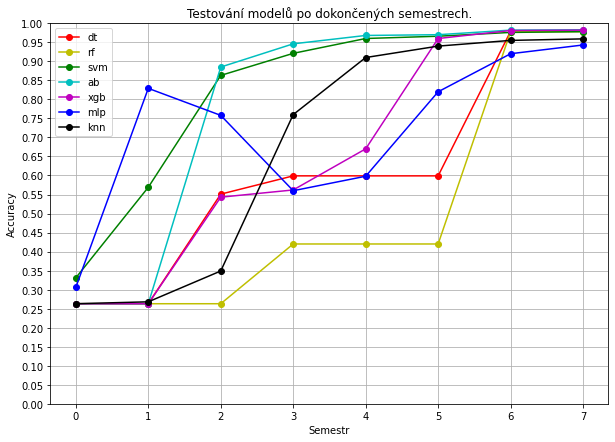

In [75]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results_mean['dt'].index
ydt = results_mean['dt'].values

xrf = results_mean['rf'].index
yrf = results_mean['rf'].values

xsvm = results_mean['svm'].index
ysvm = results_mean['svm'].values

xab = results_mean['ab'].index
yab = results_mean['ab'].values

xxgb = results_mean['xgb'].index
yxgb = results_mean['xgb'].values

xmlp = results_mean['mlp'].index
ymlp = results_mean['mlp'].values

xknn = results_mean['knn'].index
yknn = results_mean['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')

plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('Accuracy')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

In [76]:
results_mean

,dt,rf,svm,ab,xgb,mlp,knn
0,0.263,0.263,0.331,0.263,0.263,0.306,0.263
1,0.263,0.263,0.569,0.263,0.263,0.829,0.268
2,0.551,0.263,0.863,0.885,0.543,0.758,0.349
3,0.599,0.42,0.921,0.946,0.562,0.56,0.76
4,0.599,0.42,0.96,0.968,0.67,0.598,0.91
5,0.599,0.42,0.966,0.97,0.96,0.82,0.94
6,0.979,0.978,0.976,0.982,0.981,0.92,0.955
7,0.979,0.978,0.978,0.983,0.982,0.943,0.959


### Měřeno f1_score

In [77]:
x_test = {0:Xtest_0, 1:Xtest_1, 2:Xtest_2, 3:Xtest_3, 4:Xtest_4, 5:Xtest_5, 6:Xtest_6, 7:Xtest}
for i in range(0, 8):
    results_f1.loc[i, 'dt'] = round(metrics.f1_score(ytest, dt_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'rf'] = round(metrics.f1_score(ytest, rf_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'svm'] = round(metrics.f1_score(ytest, svc_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'ab'] = round(metrics.f1_score(ytest, ab_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'xgb'] = round(metrics.f1_score(ytest, xgb_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'mlp'] = round(metrics.f1_score(ytest, mlp.predict(x_test[i])), 3)
    results_f1.loc[i, 'knn'] = round(metrics.f1_score(ytest, knn.predict(x_test[i])), 3)

In [78]:
x_test_mean = {0:Xtest_0_mean, 1:Xtest_1_mean, 2:Xtest_2_mean, 3:Xtest_3_mean, 4:Xtest_4_mean, 5:Xtest_5_mean, 6:Xtest_6_mean, 7:Xtest}
for i in range(0, 8):
    results_mean_f1.loc[i, 'dt'] = round(metrics.f1_score(ytest, dt_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'rf'] = round(metrics.f1_score(ytest, rf_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'svm'] = round(metrics.f1_score(ytest, svc_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'ab'] = round(metrics.f1_score(ytest, ab_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'xgb'] = round(metrics.f1_score(ytest, xgb_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'mlp'] = round(metrics.f1_score(ytest, mlp.predict(x_test[i])), 3)
    results_mean_f1.loc[i, 'knn'] = round(metrics.f1_score(ytest, knn.predict(x_test[i])), 3)

#### Po doplnění 0

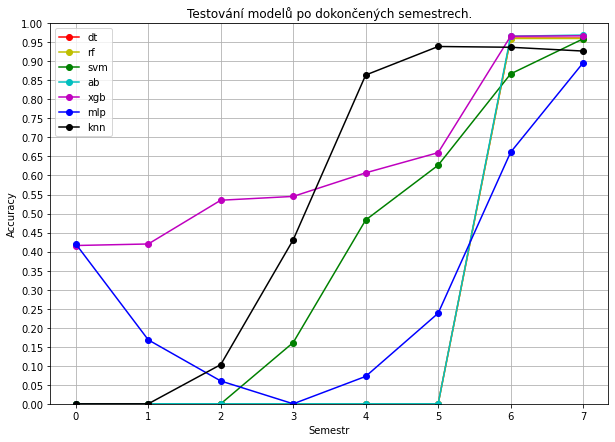

In [79]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results_f1['dt'].index
ydt = results_f1['dt'].values

xrf = results_f1['rf'].index
yrf = results_f1['rf'].values

xsvm = results_f1['svm'].index
ysvm = results_f1['svm'].values

xab = results_f1['ab'].index
yab = results_f1['ab'].values

xxgb = results_f1['xgb'].index
yxgb = results_f1['xgb'].values

xmlp = results_f1['mlp'].index
ymlp = results_f1['mlp'].values

xknn = results_f1['knn'].index
yknn = results_f1['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')


plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('Accuracy')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

In [80]:
results_f1

,dt,rf,svm,ab,xgb,mlp,knn
0,0,0,0,0,0.416,0.42,0
1,0,0,0,0,0.42,0.168,0
2,0,0,0,0,0.535,0.06,0.103
3,0,0,0.161,0,0.545,0,0.431
4,0,0,0.483,0,0.607,0.072,0.864
5,0,0,0.627,0,0.66,0.238,0.939
6,0.961,0.96,0.867,0.966,0.966,0.661,0.937
7,0.961,0.96,0.959,0.969,0.967,0.896,0.927


#### Po doplněni průměrem

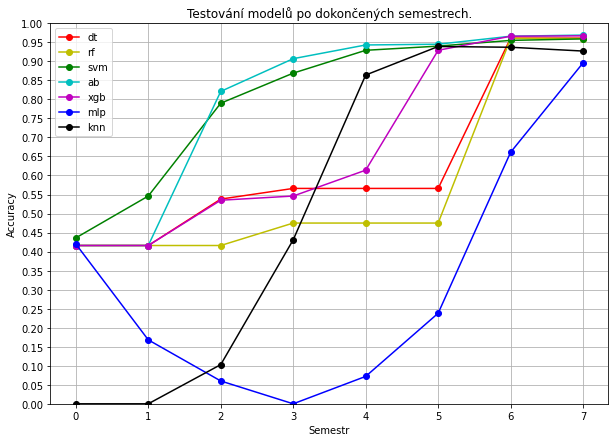

In [81]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results_mean_f1['dt'].index
ydt = results_mean_f1['dt'].values

xrf = results_mean_f1['rf'].index
yrf = results_mean_f1['rf'].values

xsvm = results_mean_f1['svm'].index
ysvm = results_mean_f1['svm'].values

xab = results_mean_f1['ab'].index
yab = results_mean_f1['ab'].values

xxgb = results_mean_f1['xgb'].index
yxgb = results_mean_f1['xgb'].values

xmlp = results_mean_f1['mlp'].index
ymlp = results_mean_f1['mlp'].values

xknn = results_mean_f1['knn'].index
yknn = results_mean_f1['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')


plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('Accuracy')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

In [83]:
results_mean_f1

,dt,rf,svm,ab,xgb,mlp,knn
0,0.416,0.416,0.436,0.416,0.416,0.42,0
1,0.416,0.416,0.546,0.416,0.416,0.168,0
2,0.538,0.416,0.79,0.821,0.535,0.06,0.103
3,0.566,0.475,0.869,0.907,0.546,0,0.431
4,0.566,0.475,0.929,0.943,0.614,0.072,0.864
5,0.566,0.475,0.94,0.945,0.929,0.238,0.939
6,0.961,0.96,0.955,0.966,0.966,0.661,0.937
7,0.961,0.96,0.959,0.969,0.967,0.896,0.927
